## San fransisco Airbnb listings

you can download all and Sanfransisco data from [here](http://insideairbnb.com/get-the-data.html?source=post_page---------------------------) and also from [here](https://data.world/ajsanne/sf-airbnb-listings). Download only listings.csv.gz from the website.

San fransisco visualizations [here](http://insideairbnb.com/san-francisco/)

Data we have is upto 8th july 2019

### Workflow
- Importing libraries
- Data loading
- Data cleaning
    - remove url columns
    - remove highly correlated
    - remove features morethan 50%
    - columns with unique values
    - Dtype conversion
    - Column renaming
    - imputing missing values
- EDA
    - plots
    - maps
- Data preprocessing
    - Label encoding
    - one-hot encoding
    - Standardization
    - Outlier removal
- Variance inflation factor(remove multicollinearity vars)
- model building
    - Base model
    - Hyper parameter tunning
- Feature selection
    - feature importances
    - TPOT Calssifier
- Model building-2
    - Model with tpot parameters.

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import bamboolib as bb

import warnings
warnings.filterwarnings('ignore')

In [41]:
data = pd.read_csv('listings.csv')

In [42]:
data.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,958,https://www.airbnb.com/rooms/958,20190708031549,2019-07-08,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,...,t,f,moderate,f,f,1,1,0,0,1.60
1,3850,https://www.airbnb.com/rooms/3850,20190708031549,2019-07-08,Charming room for two,Your own private room plus access to a shared ...,"This is the first room I rented on Airbnb, sta...",Your own private room plus access to a shared ...,none,"This is a quiet, safe neighborhood on a substa...",...,f,f,strict_14_with_grace_period,f,f,3,0,3,0,1.04
2,5858,https://www.airbnb.com/rooms/5858,20190708031549,2019-07-08,Creative Sanctuary,NaN,We live in a large Victorian house on a quiet ...,We live in a large Victorian house on a quiet ...,none,I love how our neighborhood feels quiet but is...,...,f,f,strict_14_with_grace_period,f,f,1,1,0,0,0.90
3,7918,https://www.airbnb.com/rooms/7918,20190708031549,2019-07-08,A Friendly Room - UCSF/USF - San Francisco,Nice and good public transportation. 7 minute...,Room rental-sunny view room/sink/Wi Fi (inner ...,Nice and good public transportation. 7 minute...,none,"Shopping old town, restaurants, McDonald, Whol...",...,f,f,strict_14_with_grace_period,f,f,9,0,9,0,0.14
4,8142,https://www.airbnb.com/rooms/8142,20190708031549,2019-07-08,Friendly Room Apt. Style -UCSF/USF - San Franc...,Nice and good public transportation. 7 minute...,Room rental Sunny view Rm/Wi-Fi/TV/sink/large ...,Nice and good public transportation. 7 minute...,none,NaN,...,f,f,strict_14_with_grace_period,f,f,9,0,9,0,0.14


In [43]:
data.iloc[0:10,40:60].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 20 columns):
neighbourhood_group_cleansed    0 non-null float64
city                            10 non-null object
state                           10 non-null object
zipcode                         10 non-null object
market                          10 non-null object
smart_location                  10 non-null object
country_code                    10 non-null object
country                         10 non-null object
latitude                        10 non-null float64
longitude                       10 non-null float64
is_location_exact               10 non-null object
property_type                   10 non-null object
room_type                       10 non-null object
accommodates                    10 non-null int64
bathrooms                       10 non-null float64
bedrooms                        10 non-null float64
beds                            10 non-null float64
bed_type                   

In [4]:
data.shape

(7738, 106)

In [5]:
data.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       ...
       'instant_bookable', 'is_business_travel_ready', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month'],
      dtype='object', length=106)

In [44]:
# null values in each column
values = data.columns
for i in values:
    print(f'number of null values for \033[95m{i}\033[0m: {((data[i].isna().sum()/data.shape[0]).round(2)*100)>50}')

number of null values for id: False
number of null values for listing_url: False
number of null values for scrape_id: False
number of null values for last_scraped: False
number of null values for name: False
number of null values for summary: False
number of null values for space: False
number of null values for description: False
number of null values for experiences_offered: False
number of null values for neighborhood_overview: False
number of null values for notes: False
number of null values for transit: False
number of null values for access: False
number of null values for interaction: False
number of null values for house_rules: False
number of null values for thumbnail_url: True
number of null values for medium_url: True
number of null values for picture_url: False
number of null values for xl_picture_url: True
number of null values for host_id: False
number of null values for host_url: False
number of null values for host_name: False
number of null values for host_since: Fals

**Note**:-
- after observing we found **thumbnail_url, medium_url, xl_picture_url, host_acceptance_rate, neighbourhood_group_cleansed, square_feet, weekly_price, monthly_price** has more than 50% missing values, hence drop them.

In [7]:
columns = ['thumbnail_url','medium_url','xl_picture_url','neighbourhood_group_cleansed','square_feet','weekly_price','monthly_price']

data = data.drop(columns, axis = 1)

Now, Columns with morethan 50% are missing.

In [8]:
#check for duplicates
data.duplicated().sum()

0

So we have no null values

In [9]:
#unique values in all columns
values = data.columns
for i in values:
    print(f'number of unique values for \033[94m{i}\033[0m: {data[i].nunique()}')


number of unique values for id: 7738
number of unique values for listing_url: 7738
number of unique values for scrape_id: 1
number of unique values for last_scraped: 1
number of unique values for name: 7486
number of unique values for summary: 6401
number of unique values for space: 5481
number of unique values for description: 7015
number of unique values for experiences_offered: 1
number of unique values for neighborhood_overview: 4388
number of unique values for notes: 3608
number of unique values for transit: 4358
number of unique values for access: 4258
number of unique values for interaction: 3995
number of unique values for house_rules: 4390
number of unique values for picture_url: 7457
number of unique values for host_id: 4200
number of unique values for host_url: 4200
number of unique values for host_name: 2131
number of unique values for host_since: 2269
number of unique values for host_location: 171
number of unique values for host_about: 3076
number of unique values for hos

In [10]:
data.describe()

,id,scrape_id,host_id,host_acceptance_rate,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,7.738000e+03,7.738000e+03,7.738000e+03,0.0,7736.000000,7736.000000,7738.000000,7738.000000,7738.000000,7720.000000,...,6114.000000,6112.000000,6115.000000,6112.000000,6112.000000,7738.000000,7738.000000,7738.000000,7738.000000,6165.00000
mean,1.868475e+07,2.019071e+13,5.442105e+07,NaN,72.953852,72.953852,37.766045,-122.430242,3.204187,1.371438,...,9.629866,9.856348,9.839738,9.682919,9.410831,21.197209,17.781080,2.872060,0.544068,1.86644
std,1.145804e+07,0.000000e+00,7.139031e+07,NaN,249.841676,249.841676,0.022681,0.026841,1.921471,0.862045,...,0.783791,0.551381,0.588982,0.713557,0.803303,52.929449,51.918137,6.504205,2.999235,2.04749
min,9.580000e+02,2.019071e+13,4.600000e+01,NaN,0.000000,0.000000,37.704870,-122.513060,1.000000,0.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.00000
25%,7.991781e+06,2.019071e+13,4.184590e+06,NaN,1.000000,1.000000,37.751443,-122.442725,2.000000,1.000000,...,9.000000,10.000000,10.000000,10.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.31000
50%,2.026853e+07,2.019071e+13,2.014508e+07,NaN,2.000000,2.000000,37.768475,-122.424745,2.000000,1.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,2.000000,1.000000,0.000000,0.000000,1.04000
75%,2.929977e+07,2.019071e+13,8.331836e+07,NaN,10.000000,10.000000,37.785520,-122.410820,4.000000,1.500000,...,10.000000,10.000000,10.000000,10.000000,10.000000,8.000000,2.000000,2.000000,0.000000,2.84000
max,3.648198e+07,2.019071e+13,2.738296e+08,NaN,1297.000000,1297.000000,37.810310,-122.368570,16.000000,14.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,249.000000,249.000000,43.000000,25.000000,14.43000


In [11]:
import pandas_profiling as pp

In [12]:
pp.ProfileReport(data)

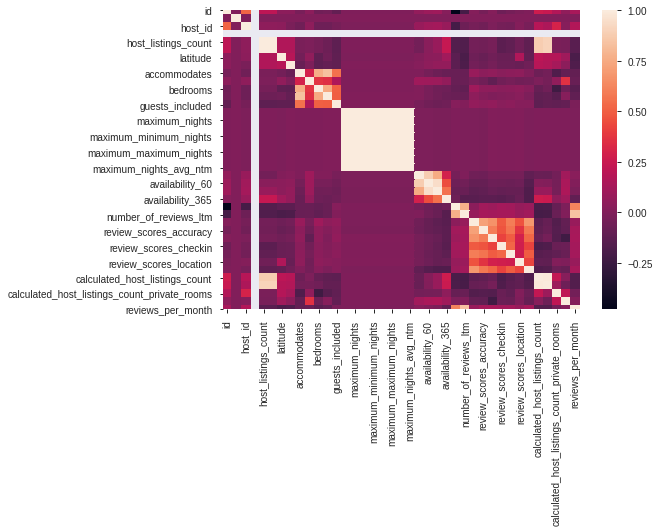

In [13]:
sns.heatmap(data.corr())

from the Heat map we can understand that we have high correlation between variables
- host_listings_count vs calculated_host_listings_count_entire_homes.
- host_total_listings_count vs host_listings_count.
- maximum_minimum_nights vs maximum_maximum_nights.
- maximum_nights vs maximum_minimum_nights.
- maximum_nights_avg_ntm vs maximum_nights.
- minimum_maximum_nights vs maximum_nights_avg_ntm.
- minimum_minimum_nights vs minimum_maximum_nights.
- minimum_nights vs minimum_minimum_nights.
- minimum_nights_avg_ntm minimum_nights.

drop one in the two variables.


remove urls

In [14]:
columns = ['availability_90','calculated_host_listings_count','host_listings_count','host_total_listings_count','maximum_minimum_nights','maximum_nights','maximum_nights_avg_ntm','minimum_maximum_nights','minimum_minimum_nights','minimum_nights','minimum_nights_avg_ntm']

data = data.drop(columns,axis = 1)

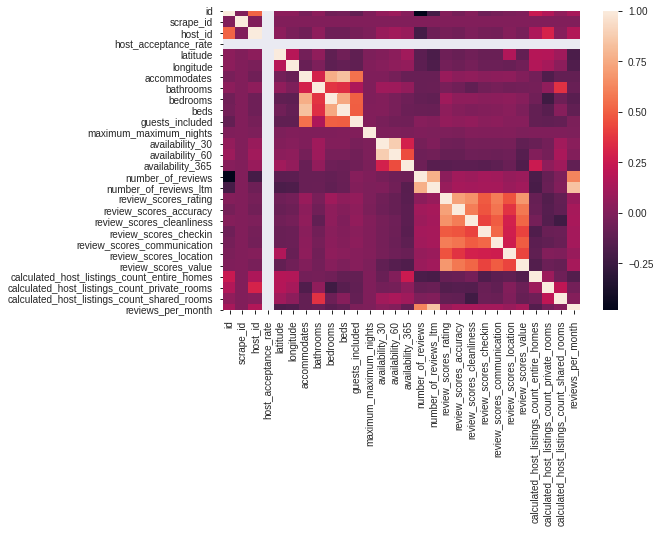

In [15]:
sns.heatmap(data.corr())

columns that are not useful

In [16]:
columns = ['picture_url','host_url','host_thumbnail_url','host_picture_url','listing_url', 'scrape_id','last_scraped','experiences_offered','calendar_last_scraped','country','country_code','experiences_offered','has_availability','is_business_travel_ready']

data = data.drop(columns,axis= 1)

In [17]:
data.columns

Index(['id', 'name', 'summary', 'space', 'description',
       'neighborhood_overview', 'notes', 'transit', 'access', 'interaction',
       'house_rules', 'host_id', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed', 'city', 'state',
       'zipcode', 'market', 'smart_location', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'price',
       'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
       'maximum_maximum_nights', 'calendar_updated', 'availability_30',
       'availability_60', 'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'first_review', 'last_revie

In [18]:
values = data.columns
for i in values:
    print(f'number of unique values for \033[94m{i}\033[0m: {data[i].value_counts().head(10)}')


number of unique values for id: 6604799     1
435390      1
29992190    1
19285250    1
17288451    1
33400608    1
21079302    1
27187399    1
14886240    1
18459919    1
Name: id, dtype: int64
number of unique values for name: The Bartlett QUEEN                                    26
Stratford Hotel Room Queen                            25
Discounted Union Square Hotel                         20
Startup House SF Downtown - Private Room              16
Studio at Donatello Hotel near Union Square           13
Bunk in coliving/coworking. Heart of Hi-Tech World    12
Alamo Square Startup House - Shared Room              12
Stratford Hotel Twin/Twin                             11
Wyndham Canterbury at San Francisco 1 bedroom         11
Dorm Room with Private Bathroom                       11
Name: name, dtype: int64
number of unique values for summary: When you stay in a Zeus property you will be met with top-notch amenities including premium mattresses and bedding, organic bath products, 

Name: is_location_exact, dtype: int64
number of unique values for property_type: Apartment             3131
House                 2196
Condominium            822
Guest suite            540
Boutique hotel         229
Hotel                  151
Townhouse              143
Serviced apartment     128
Hostel                  96
Loft                    90
Name: property_type, dtype: int64
number of unique values for room_type: Entire home/apt    4703
Private room       2808
Shared room         227
Name: room_type, dtype: int64
number of unique values for accommodates: 2     3454
4     1584
1      697
6      630
3      627
5      339
8      189
7       99
10      52
12      23
Name: accommodates, dtype: int64
number of unique values for bathrooms: 1.0    5448
2.0    1085
1.5     513
2.5     212
3.0     145
5.0      79
3.5      68
4.0      57
0.0      44
0.5      20
Name: bathrooms, dtype: int64
number of unique values for bedrooms: 1.0     4515
2.0     1423
0.0      865
3.0      700
4.0      1

In [19]:
data.shape

(7738, 75)

columns that are not useful are removed.

In [45]:
columns = ['first_review','last_review','review_scores_rating','review_scores_accuracy','number_of_reviews_ltm','calculated_host_listings_count_private_rooms','calculated_host_listings_count_entire_homes','calculated_host_listings_count_shared_rooms','license','reviews_per_month','market','access','jurisdiction_names','summary','street','name','space','description', 'neighborhood_overview','notes','transit','city','state','zipcode','smart_location','calendar_updated','requires_license','interaction','house_rules','host_about']

data = data.drop(columns,axis = 1)

Removing columns that are not making any sense

In [46]:
columns = ['neighbourhood','neighbourhood_cleansed','availability_30','availability_60','availability_365','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value']

data = data.drop(columns,axis = 1)

In [47]:
data.shape

(7738, 66)

In [48]:
data.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'experiences_offered',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_group_cleansed', 'country_code', 'country', 'latitude',
       'longitude', 'is_location_exact', 'property_type', 'room_type',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type',
       'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price',
       'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimu

### heatmap

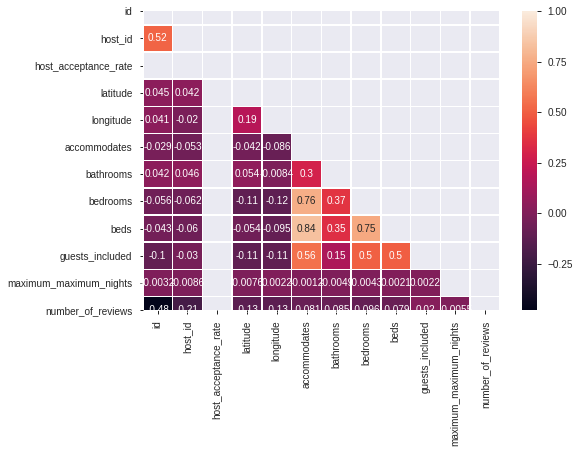

In [24]:
corr = data.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(data.corr(),annot = True,linewidths=.5,fmt='.2g',mask = mask)

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7738 entries, 0 to 7737
Data columns (total 35 columns):
id                                  7738 non-null int64
host_id                             7738 non-null int64
host_name                           7736 non-null object
host_since                          7736 non-null object
host_location                       7732 non-null object
host_response_time                  6960 non-null object
host_response_rate                  6960 non-null object
host_acceptance_rate                0 non-null float64
host_is_superhost                   7736 non-null object
host_neighbourhood                  7233 non-null object
host_verifications                  7738 non-null object
host_has_profile_pic                7736 non-null object
host_identity_verified              7736 non-null object
latitude                            7738 non-null float64
longitude                           7738 non-null float64
is_location_exact                   7738

from the above we can see that **host_since,host_is_superhost, host_response_rate, host_verifications, host_has_profile_pic,host_identity_verified, is_location_exact, price, security_deposit, cleaning_fee, extra_people, instant_bookable, require_guest_profile_picture, require_guest_phone_verification** are not in the right data type.

In [26]:
data['host_since'] = pd.to_datetime(data['host_since'])
data['host_response_rate'] = data['host_response_rate'].str.replace('%','')

#replacing dollar
col = ['price','security_deposit','cleaning_fee','extra_people','host_response_rate']
for i in col:
    data[i] = data[i].str.replace('$','')
    data[i] = data[i].str.replace(',','')
    data[i] = data[i].astype(float)
    
#converte bool type columns to int type
col1 = ['host_is_superhost','host_has_profile_pic','host_identity_verified','is_location_exact','instant_bookable','require_guest_profile_picture','require_guest_phone_verification']
for i in col1:
    data[i] = pd.get_dummies(data[i])

In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7738 entries, 0 to 7737
Data columns (total 35 columns):
id                                  7738 non-null int64
host_id                             7738 non-null int64
host_name                           7736 non-null object
host_since                          7736 non-null datetime64[ns]
host_location                       7732 non-null object
host_response_time                  6960 non-null object
host_response_rate                  6960 non-null float64
host_acceptance_rate                0 non-null float64
host_is_superhost                   7738 non-null uint8
host_neighbourhood                  7233 non-null object
host_verifications                  7738 non-null object
host_has_profile_pic                7738 non-null uint8
host_identity_verified              7738 non-null uint8
latitude                            7738 non-null float64
longitude                           7738 non-null float64
is_location_exact                 

### missing values

In [28]:
data.isna().sum()

id                                     0
host_id                                0
host_name                              2
host_since                             2
host_location                          6
host_response_time                   778
host_response_rate                   778
host_acceptance_rate                7738
host_is_superhost                      0
host_neighbourhood                   505
host_verifications                     0
host_has_profile_pic                   0
host_identity_verified                 0
latitude                               0
longitude                              0
is_location_exact                      0
property_type                          0
room_type                              0
accommodates                           0
bathrooms                             18
bedrooms                               3
beds                                   9
bed_type                               0
amenities                              0
price           

In [29]:
data = data.dropna(subset = ['host_name','host_since','host_location','bathrooms','bedrooms','beds','cancellation_policy'])

In [30]:
data.isna().sum()

id                                     0
host_id                                0
host_name                              0
host_since                             0
host_location                          0
host_response_time                   772
host_response_rate                   772
host_acceptance_rate                7703
host_is_superhost                      0
host_neighbourhood                   501
host_verifications                     0
host_has_profile_pic                   0
host_identity_verified                 0
latitude                               0
longitude                              0
is_location_exact                      0
property_type                          0
room_type                              0
accommodates                           0
bathrooms                              0
bedrooms                               0
beds                                   0
bed_type                               0
amenities                              0
price           

In [31]:
data['security_deposit'] = data['security_deposit'].fillna(0)
data['cleaning_fee'] = data['cleaning_fee'].fillna(0)

In [32]:
data = data.dropna()

In [33]:
data.shape

(0, 35)

### EDA

In [34]:
#hostname
data['host_name'] = data['host_name'].replace('Sonder (San Francisco)','Sonder')
data.host_name.value_counts()[:10].plot(kind = 'bar')
plt.title("Top 10 hosts in AirBnB")

TypeError: no numeric data to plot

### who is the host from the begining?

In [ ]:
#host since
data[['host_name','host_since']][data['host_since'] == data['host_since'].min()]

In [ ]:
data[data['host_since'] == data['host_since'].min()]

**Note**:-
- Elizabeth is the  only host from the begining of **AirBnB** in san fransisco.

### where do most of the hosts live in?

In [ ]:
data['host_location'] = data['host_location'].replace('California, United States','Los Angeles, California, United States')


In [ ]:
hostlocation = pd.DataFrame(data['host_location'].value_counts().head(5).reset_index())

In [ ]:
#plt.figure(figsize = (8,6))
sns.barplot(x = hostlocation['index'], y =hostlocation['host_location'],data = hostlocation)
plt.xticks(rotation  =90)
plt.title('Top 5 host locations')
plt.xlabel('host location')
plt.ylabel('counts')

### How fast host responses?

In [ ]:
data['host_response_time'].value_counts().plot(kind = 'area',color = 'orange')

In [ ]:
#plt.figure(figsize = (8,6))
sns.pointplot(x = data['host_response_time'].value_counts().index, y =data['host_response_time'].value_counts().values,color = 'red')
plt.title('Respose time of hosts')
plt.xlabel('Response time')
plt.ylabel('Count')

### How many are the hosts with 100% response rate?

In [ ]:
hresponserate = pd.DataFrame(data['host_response_rate'].value_counts().head().reset_index())

In [ ]:
sns.barplot(x = hresponserate['index'],y = hresponserate.host_response_rate,palette = 'viridis')
plt.xlabel("Host response rate")
plt.ylabel('count')
plt.title("Host Response rate vs Count")


### what is the hosts count with response rate between 80% and 100%?

In [ ]:
response80 = data[data['host_response_rate'] >= 80.0] 

In [ ]:
response80_100 = response80[response80['host_response_rate']<= 100.0]

In [ ]:
new = pd.DataFrame({'Responserate': ['Response rate 80 to 100'],'value' : response80_100['host_response_rate'].count()})

In [ ]:
new

so we have 6153 hosts with responserate between 80 and 100.

### How many devotedhosts/super hsots we have?

**The four criteria that hosts must meet to become an Airbnb Superhost are:**

- Host a minimum of 10 stays in a year
- Respond to guests quickly and maintain a 90% response rate or higher
- Have at least 80% 5-star reviews
- Honor confirmed reservations (meaning hosts should rarely cancel)

In [49]:
data['host_is_superhost'] = data['host_is_superhost'].map({0: 'host', 1: 'superhost'})

In [50]:
sns.countplot(data['host_is_superhost'],facecolor=(0, 0, 0, 0),linewidth=5, edgecolor=sns.color_palette("rocket", 2))

ValueError: min() arg is an empty sequence

In [37]:
data.columns

Index(['id', 'host_id', 'host_name', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_neighbourhood', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'latitude',
       'longitude', 'is_location_exact', 'property_type', 'room_type',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type',
       'amenities', 'price', 'security_deposit', 'cleaning_fee',
       'guests_included', 'extra_people', 'maximum_maximum_nights',
       'number_of_reviews', 'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification'],
      dtype='object')

### Top10 neighbourhoods of host

In [38]:
host_nlocation = pd.DataFrame(data['host_neighbourhood'].value_counts().head(20).reset_index())

In [39]:
sns.barplot(x = host_nlocation['host_neighbourhood'],y = host_nlocation['index'],data = host_nlocation,palette = 'spring')
plt.xlabel('Neighbourhood counts')
plt.ylabel('Host Neighbourhood')
plt.title('Top 10 Hosts Neighbourhood Location')

ValueError: Buffer has wrong number of dimensions (expected 1, got 2)

### how many of the hosts identity verified?

**Hosts are verified with**
- 1.Their online Establishments.
- 2.Govt ID Card proof
- 3.Online Profile name match with Offline Name

In [214]:
data['host_identity_verified'] = data['host_identity_verified'].map({0: 'Verified', 1: 'Not verified'})

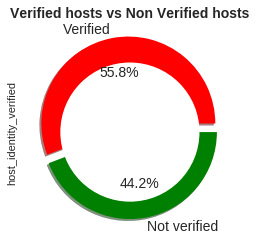

In [215]:
data['host_identity_verified'].value_counts().plot(kind = 'pie',autopct='%1.1f%%',fontsize=14,shadow=True,explode = (0.1,0.0),colors = ['red','green'])

plt.title('Verified hosts vs Non Verified hosts',weight = 'bold',fontsize = 14)
centre_circle = plt.Circle((0,0),0.80,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

### How many hosts has Wrong Location?

(array([0, 1]), <a list of 2 Text xticklabel objects>)

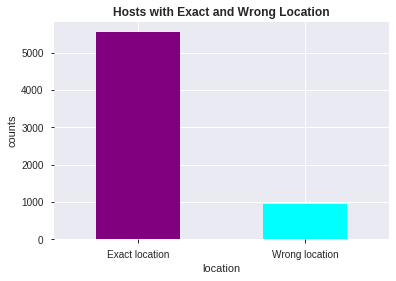

In [216]:
colors = ['#800080','#00FFFF']

data['is_location_exact'].map({0:'Exact location',1:'Wrong location'}).value_counts().plot(kind = 'bar',colors =colors)
plt.title("Hosts with Exact and Wrong Location",weight = 'bold')
plt.xlabel('location')
plt.ylabel('counts')
plt.xticks(rotation = 0)

We have almost 1000 hosts with Wrong location.

### Top 5 spaces that Hosts give?

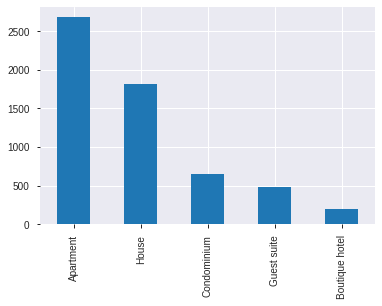

In [217]:
data['property_type'].value_counts().head(5).plot(kind = 'bar')

the above shown are the top 5 spaces that airbnb offering most.

### what are different room types, which are most?

In [218]:
data['room_type'].value_counts()

Entire home/apt    3902
Private room       2383
Shared room         203
Name: room_type, dtype: int64

In [219]:
data.columns

Index(['id', 'host_id', 'host_name', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'latitude', 'longitude', 'is_location_exact',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'amenities', 'price', 'security_deposit',
       'cleaning_fee', 'guests_included', 'extra_people',
       'maximum_maximum_nights', 'number_of_reviews', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification'],
      dtype='object')

### Accomodates

In [220]:
acc = pd.DataFrame(data['accommodates'].value_counts().reset_index())

In [221]:
colors = ['red','green','yellow','orange','blue','pink','gold','cyan']

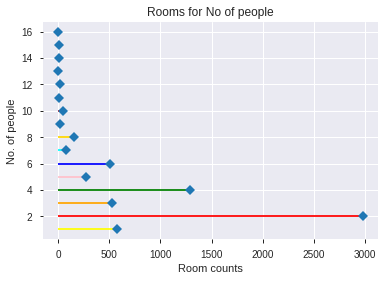

In [222]:
import seaborn as sns
plt.hlines(y=data['accommodates'].value_counts().index, xmin= data['accommodates'].value_counts().values[:: -1][0], xmax=data['accommodates'].value_counts().values, color= colors)
plt.plot(data['accommodates'].value_counts(),acc['index'],"D")
#plt.yticks(my_range, ordered_df['group'])
plt.ylabel("No. of people")
plt.xlabel("Room counts")
plt.title('Rooms for No of people')
plt.show()

### Price

In [223]:
data['price'].value_counts()

150.0    211
100.0    176
250.0    163
200.0    141
125.0    136
        ... 
481.0      1
905.0      1
332.0      1
342.0      1
459.0      1
Name: price, Length: 476, dtype: int64

In [224]:
data['price'].value_counts().index.min()

0.0

we have a price value with 0, which is impossible.

In [225]:
data = data[data['price']!= 0 ]

In [226]:
data['price'].value_counts().index.min()

19.0

Text(0.5, 1.0, 'Number of Spaces/Listings for Different prices')

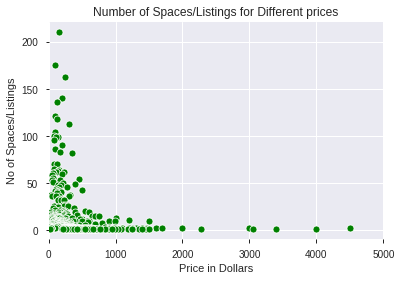

In [227]:
sns.scatterplot(data['price'].value_counts().index,data['price'].value_counts().values,color = 'green')
plt.xlabel('Price in Dollars')
plt.ylabel('No of Spaces/Listings')
plt.xlim(0,5000)
plt.title("Number of Spaces/Listings for Different prices")

- most of the rooms are in the price range of 19 USD TO 4500 USD dollars.

### Securtiy deposit

Text(0.5, 1.0, 'No of Listings with Different range of Security deposit ')

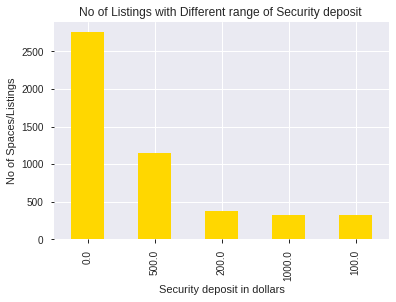

In [228]:
data['security_deposit'].value_counts().head().plot(kind = 'bar',color= 'gold')
plt.xlabel('Security deposit in dollars')
plt.ylabel('No of Spaces/Listings')
plt.title("No of Listings with Different range of Security deposit ")

- we have more than 2800 listings with security fees of 0 dollars.

### Price vs Accomodates with Beds in hue

(0, 5000)

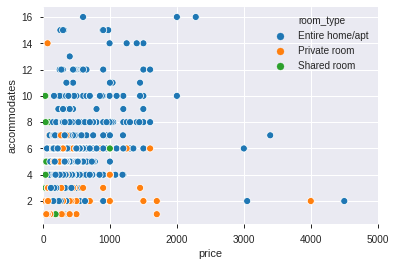

In [229]:
sns.scatterplot(x = data['price'],y = data['accommodates'],hue = data['room_type'])
plt.xlim(0,5000)

### Host with highest ratings

In [230]:
data[data['number_of_reviews']== data['number_of_reviews'].value_counts().index.max()]

,id,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_is_superhost,host_neighbourhood,host_verifications,...,security_deposit,cleaning_fee,guests_included,extra_people,maximum_maximum_nights,number_of_reviews,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
352,545685,2676602,Su,2012-06-18,"San Francisco, California, United States",within a few hours,96.0,host,Richmond District,"['email', 'phone', 'reviews']",...,200.0,35.0,1,20.0,28,724,1,moderate,1,1


- Host name SU has highest no of reviews.

### price vs property_type

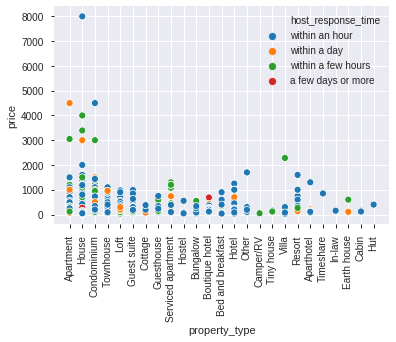

In [231]:
sns.scatterplot(data['property_type'],data['price'],hue = 'host_response_time',data = data)
plt.xticks(rotation = 90)
plt.show()

### Host verifications

In [232]:
data['host_verifications'] = data.host_verifications.astype(str)

In [233]:
data['host_verifications'] = data['host_verifications'].str.replace('[','')
data['host_verifications'] = data['host_verifications'].str.replace(']','')
data['host_verifications'] = data['host_verifications'].str.replace("'","")

In [234]:
verify_count = []
for i in data.host_verifications:
    for t in i.split(','):
        t = t.strip() # remove the white spaces to get accurate results
        verify_count.append(t)

In [235]:
pd.Series(verify_count).value_counts()

phone                    6466
email                    6243
reviews                  5327
government_id            3786
jumio                    3199
offline_government_id    2433
kba                      2252
work_email               1729
selfie                   1426
identity_manual          1260
facebook                 1211
google                    449
manual_offline            101
manual_online              66
sent_id                    17
zhima_selfie                9
                            8
weibo                       4
dtype: int64

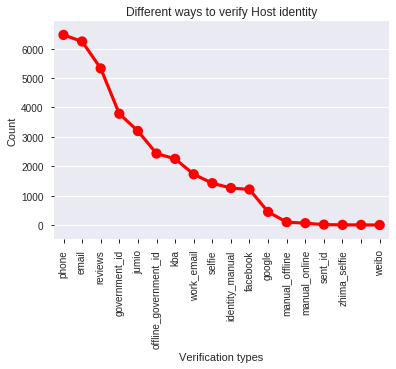

In [236]:
sns.pointplot(x= pd.Series(verify_count).value_counts().index, y= pd.Series(verify_count).value_counts().values,color = 'red', capsize=.2)
plt.xticks(rotation = 90)
plt.xlabel('Verification types')
plt.ylabel('Count')
plt.title('Different ways to verify Host identity')
plt.show()

#### Verifications wordcloud

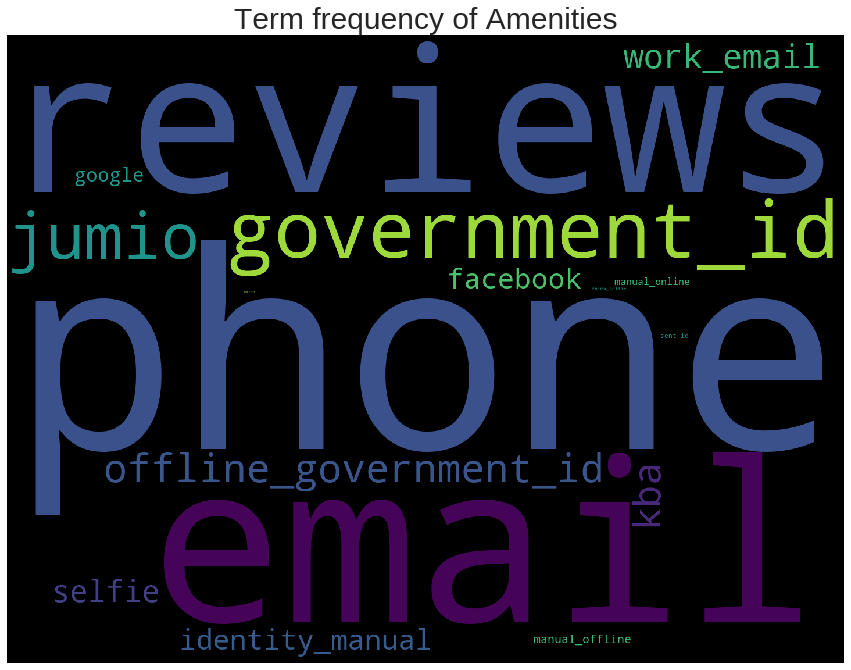

In [237]:
from wordcloud import WordCloud
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(pd.Series(verify_count).value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.title("Term frequency of Amenities",fontsize = 30)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# convert lat and long

In [238]:
data['latitude'] = data['latitude'].astype(str).str[:6]
data['longitude'] = data['longitude'].astype(str).str[:8]

### Link

link for this Map [here](https://plot.ly/python/scatter-plots-on-maps/)

**for plotting the maps**

- plotly
- folium
- Geopandas
- Basemap

In [79]:
import plotly.graph_objects as go

import pandas as pd

#df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
data['text'] = data['host_name'] + ', ' + data['host_location'] + ', responds ' + data['host_response_time'] + ', ' + ' ' + data['is_location_exact'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        lon = data['longitude'],
        lat = data['latitude'],
        text = data['text'],
        mode = 'markers',
        marker_color = data['is_location_exact'],
        ))

fig.update_layout(
        title = 'Sanfransisco AirBnB Host locations<br>(Hover for more details)',
        geo_scope='usa',
    )
fig.show()

### folium layers 
    cartodbdark_matter
    cartodbpositron
    cartodbpositronnolabels
    cartodbpositrononlylabels
    cloudmade
    mapbox
    mapboxbright
    mapboxcontrolroom
    openstreetmap
    stamenterrain
    stamentoner
    stamentonerbackground
    stamentonerlabels
    stamenwatercolor
    
also you can see all [here](https://python-graph-gallery.com/288-map-background-with-folium/)

In [80]:
import folium

In [81]:
data.shape

(6487, 35)

In [82]:
from folium import plugins

folium_map = folium.Map(location=[37.7749,-122.4194],
                        zoom_start=10,
                        tiles="CartoDB dark_matter")

for lat, lon in zip(data['latitude'][:300], data['longitude'][:300]):
    #folium.CircleMarker(location=[lat,lon],fill=True).add_to(folium_map)
     folium.Marker([lat, lon], 
              popup='East London',
              icon=folium.Icon(color='red',icon='home', prefix='fa') 
             ).add_to(folium_map)


        
minimap = plugins.MiniMap(tile_layer=None,
    position='bottomright',
    width=150,
    height=150,
    collapsed_width=5,
    collapsed_height=5,
    zoom_level_offset=-5,#for minimap zoom
    zoom_level_fixed=None,
    center_fixed=False,
    zoom_animation=True,
    toggle_display=False,
    auto_toggle_display=False,
    minimized=False
)

folium_map.add_child(minimap)

folium_map


In [83]:
from folium import plugins

folium_map = folium.Map(location=[37.7749,-122.4194],
                        zoom_start=10,
                        tiles="CartoDB dark_matter")

for lat, lon in zip(data['latitude'][:3000], data['longitude'][:3000]):
    folium.CircleMarker(location=[lat,lon],fill=True).add_to(folium_map)

minimap = plugins.MiniMap(tile_layer=None,
    position='bottomright',
    width=150,
    height=150,
    collapsed_width=5,
    collapsed_height=5,
    zoom_level_offset=-5,#for minimap zoom
    zoom_level_fixed=None,
    center_fixed=False,
    zoom_animation=True,
    toggle_display=False,
    auto_toggle_display=False,
    minimized=False
)

folium_map.add_child(minimap)

folium_map


#### this is giving only upto 3000 points.

In [84]:
from folium import plugins
from folium.plugins import HeatMap

In [85]:
heatmap = folium.Map(location=[37.7749,-122.4194], zoom_start = 11)

heat_data = [[row['latitude'],row['longitude']] for index, row in
             data[['latitude', 'longitude']].iterrows()]

hh =  HeatMap(heat_data).add_to(heatmap)


minimap = plugins.MiniMap(tile_layer=None,
    position='bottomright',
    width=150,
    height=150,
    collapsed_width=5,
    collapsed_height=5,
    zoom_level_offset=-5,#for minimap zoom
    zoom_level_fixed=None,
    center_fixed=False,
    zoom_animation=True,
    toggle_display=False,
    auto_toggle_display=False,
    minimized=False
)

heatmap.add_child(minimap)

heatmap

link for the below map [here](https://towardsdatascience.com/data-visualization-with-python-folium-maps-a74231de9ef7)

In [86]:
colordict = {'within an hour': 'red', 'within a day': 'blue', 'within a few hours' : 'orange', 'a few days or more': 'red'}

In [87]:
latitude =37.7749
longitude = -122.4194
traffic_map = folium.Map(location=[latitude, longitude])

In [88]:
for lat, lon, hname, hlocation, time, price in zip(data['latitude'][:30], data['longitude'][:30], data['host_name'][:30], data['host_location'][:30], data['host_response_time'][:30], data['price'][:30]):
    folium.CircleMarker(
        [lat, lon],
        radius=.25*price,
        popup = ('Host location: ' + str(hlocation).capitalize() + '<br>'
                 'Host response time: ' + str(time) + '<br>'
                 'Price: ' + str(price) +'$'
                ),
        color='b',
        key_on = time,
        threshold_scale=[0,1,2,3],
        fill_color=colordict[time],
        fill=True,
        fill_opacity=0.7
        ).add_to(traffic_map)
traffic_map

#### add widgets and change map layers to map-2

- folium widgets [here](https://nbviewer.jupyter.org/github/python-visualization/folium_contrib/blob/master/notebooks/HereMapsApiExplorer_no_creds.ipynb)

- Official documentation [here](https://python-visualization.github.io/folium/modules.html).

- **you can save folium maps to html by "foliummap.save('output.html')**

### Map with widgets

In [89]:
data['property_type'].value_counts().head()

Apartment         2681
House             1820
Condominium        645
Guest suite        479
Boutique hotel     197
Name: property_type, dtype: int64

In [90]:
data['room_type'].value_counts()

Entire home/apt    3902
Private room       2382
Shared room         203
Name: room_type, dtype: int64

In [91]:
data['bed_type'].value_counts()

Real Bed         6429
Futon              25
Pull-out Sofa      19
Airbed              9
Couch               5
Name: bed_type, dtype: int64

In [92]:
latitude =37.7749
longitude = -122.4194
widget_map = folium.Map(location=[latitude, longitude])

group_1 = folium.FeatureGroup(name='Finse Stations')
group_2 = folium.FeatureGroup(name='MetNo Stations')

# Add group_1 and group_2 to map
group_1.add_to(widget_map)
group_2.add_to(widget_map)
folium.LayerControl().add_to(widget_map)

In [93]:
popup = ('Host location: ' + str(hlocation).capitalize() + '<br>'
                 'Host response time: ' + str(time) + '<br>'
                 'Price: ' + str(price) +'$'
                ),

In [94]:
for i,j in zip(data['latitude'][:30],data['longitude'][:30]):
    folium.Marker(location = [i,j] , popup=popup,  icon=folium.Icon(color='blue',  icon='cloud')).add_to(group_2)

In [95]:
widget_map

## Amenities

In [96]:
data['amenities'] = data['amenities'].astype(str)

In [97]:
data['amenities']

0       {TV,"Cable TV",Internet,Wifi,Kitchen,"Pets liv...
1       {Internet,Wifi,Kitchen,Breakfast,"Free street ...
2       {Internet,Wifi,Kitchen,Heating,"Family/kid fri...
3       {TV,Internet,Wifi,Kitchen,"Free street parking...
4       {TV,Internet,Wifi,Kitchen,"Free street parking...
                              ...                        
7733    {TV,Wifi,Kitchen,Heating,Washer,Dryer,"Smoke d...
7734    {TV,Wifi,"Free street parking",Heating,"Smoke ...
7735    {TV,Wifi,Kitchen,"Smoking allowed","Pets allow...
7736    {TV,Wifi,"Air conditioning",Kitchen,Heating,Wa...
7737    {Wifi,"Air conditioning",Kitchen,"Paid parking...
Name: amenities, Length: 6487, dtype: object

In [98]:
data['amenities'] = data['amenities'].str.replace(' ','_')
data['amenities'] = data['amenities'].str.replace('"','')
data['amenities'] = data['amenities'].str.replace('{','')
#data['amenities'] = data['amenities'].str.replace(' ','_')


In [99]:
amenities_count = []
for i in data.amenities:
    for t in i.split(','):
        t = t.strip() # remove the white spaces to get accurate results
        amenities_count.append(t)

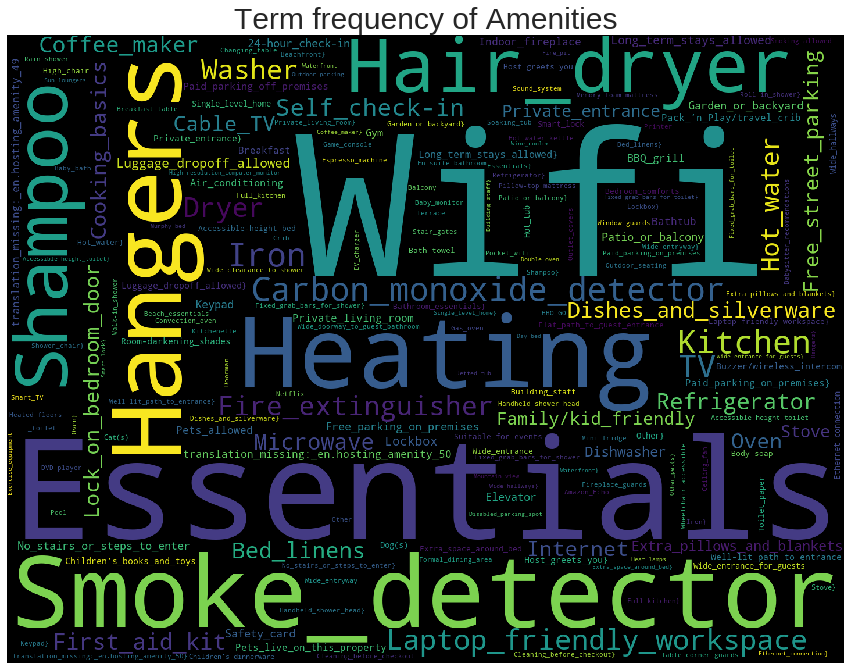

In [100]:
from wordcloud import WordCloud
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(pd.Series(amenities_count).value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.title("Term frequency of Amenities",fontsize = 30)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [239]:
pd.Series(amenities_count).value_counts()

Wifi                  6407
Essentials            6258
Smoke_detector        6173
Heating               6172
Hangers               5957
                      ... 
Garage_parking           1
En_suite_bathroom}       1
Rooftop                  1
Ironing_Board            1
Ski-in/Ski-out}          1
Length: 279, dtype: int64

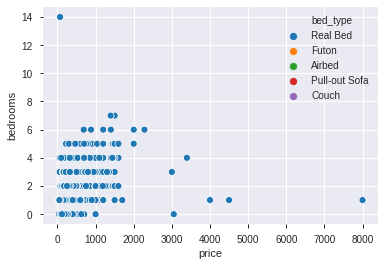

In [240]:
sns.scatterplot(data['price'],data['bedrooms'],hue = data['bed_type'])

In [241]:
data.columns

Index(['id', 'host_id', 'host_name', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'latitude', 'longitude', 'is_location_exact',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'amenities', 'price', 'security_deposit',
       'cleaning_fee', 'guests_included', 'extra_people',
       'maximum_maximum_nights', 'number_of_reviews', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification'],
      dtype='object')

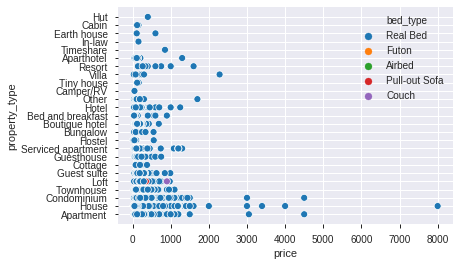

In [242]:
sns.scatterplot(data['price'],data['property_type'],hue = data['bed_type'])

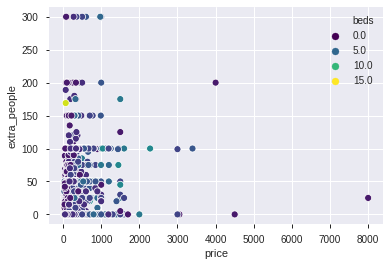

In [243]:
sns.scatterplot(data['price'],data['extra_people'],hue = data['beds'],palette  ='viridis')

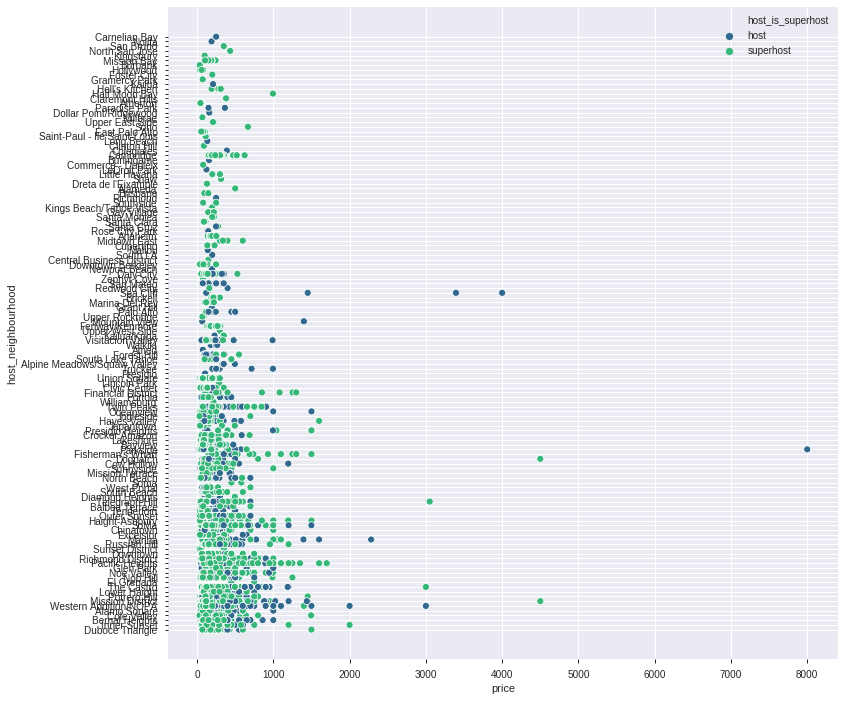

In [244]:
plt.figure(figsize = (12,12))
sns.scatterplot(data['price'],data['host_neighbourhood'],hue = data['host_is_superhost'],palette  ='viridis')

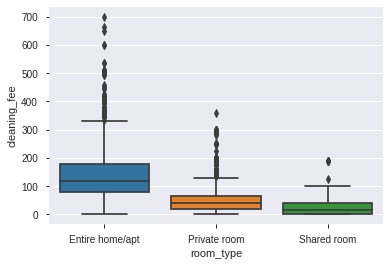

In [245]:
sns.boxplot(data['room_type'], data['cleaning_fee'])

### do bed types makes difference in price?

(0, 1000)

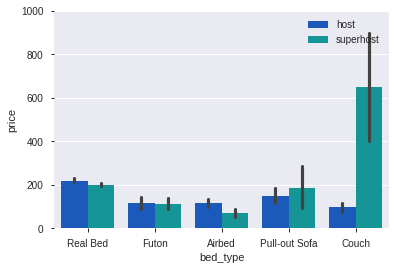

In [246]:
sns.barplot(data['bed_type'],data['price'],hue = 'host_is_superhost',data = data,palette = 'winter')
plt.legend(loc = 'upper right')
plt.ylim(0,1000)

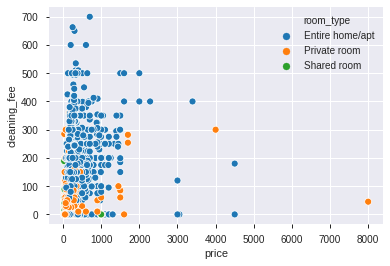

In [247]:
sns.scatterplot(data['price'],data['cleaning_fee'],hue = 'room_type', data  = data)

### What is the Avg price of every nighbourhood? which is highest?

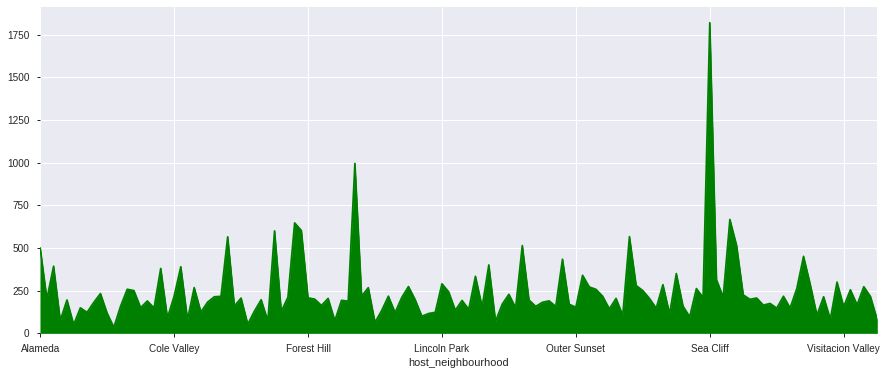

In [248]:
plt.figure(figsize = (15,6))
data.groupby('host_neighbourhood')['price'].mean().plot(kind = 'area',color = 'green')

### Top space in Top 20 neighbourhoods

In [249]:
topNSpaces = data.groupby(['host_neighbourhood','property_type'])['price'].mean().sort_values(ascending = False)

In [250]:
topNSpaces = topNSpaces.reset_index()

In [251]:
topNSpaces = topNSpaces.drop_duplicates(subset='host_neighbourhood', keep = 'first')

In [252]:
topNSpaces.head()

,host_neighbourhood,property_type,price
0,Dogpatch,Condominium,2302.5
1,Sea Cliff,House,1820.0
2,Mountain View,House,1400.0
3,Pacific Heights,Resort,1300.0
4,Fisherman's Wharf,Aparthotel,1300.0


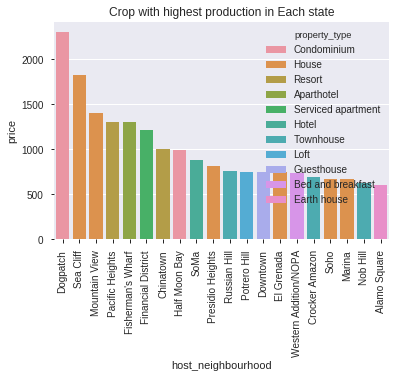

In [253]:
sns.barplot(x  = 'host_neighbourhood',y = 'price', data = topNSpaces.head(20),hue = 'property_type',dodge= False )
plt.xticks(rotation =90)
plt.title("Crop with highest production in Each state")
plt.show()

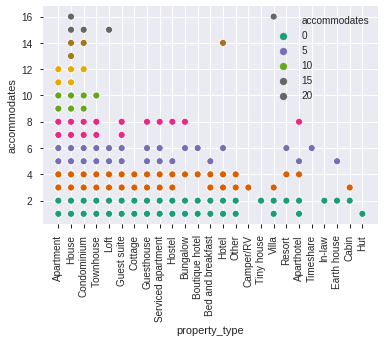

In [254]:
sns.scatterplot(x = 'property_type',y = 'accommodates',data = data,hue = 'accommodates',palette  = 'Dark2')
plt.xticks(rotation = 90)
plt.show()

In [255]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6487 entries, 0 to 7737
Data columns (total 34 columns):
id                                  6487 non-null int64
host_id                             6487 non-null int64
host_name                           6487 non-null object
host_since                          6487 non-null datetime64[ns]
host_location                       6487 non-null object
host_response_time                  6487 non-null object
host_response_rate                  6487 non-null float64
host_is_superhost                   6487 non-null object
host_neighbourhood                  6487 non-null object
host_verifications                  6487 non-null object
host_has_profile_pic                6487 non-null uint8
host_identity_verified              6487 non-null object
latitude                            6487 non-null object
longitude                           6487 non-null object
is_location_exact                   6487 non-null uint8
property_type                    

### Model building

In [256]:
data.columns

Index(['id', 'host_id', 'host_name', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'latitude', 'longitude', 'is_location_exact',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'amenities', 'price', 'security_deposit',
       'cleaning_fee', 'guests_included', 'extra_people',
       'maximum_maximum_nights', 'number_of_reviews', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification'],
      dtype='object')

In [257]:
data1 = data[['host_is_superhost','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','price']]

### label encoding

In [120]:
data1['host_is_superhost'] = pd.get_dummies(data['host_is_superhost'])
property_types = pd.get_dummies(data['property_type'])
room_types = pd.get_dummies(data['room_type'])
bed_types = pd.get_dummies(data1['bed_type'])

In [121]:
final = pd.concat([data1,property_types,room_types,bed_types],axis = 1)

In [122]:
final.drop(['property_type','room_type','bed_type'],axis=1,inplace  =True)

In [123]:
final

,host_is_superhost,accommodates,bathrooms,bedrooms,beds,price,Aparthotel,Apartment,Bed and breakfast,Boutique hotel,...,Townhouse,Villa,Entire home/apt,Private room,Shared room,Airbed,Couch,Futon,Pull-out Sofa,Real Bed
0,1,3,1.0,1.0,2.0,170.0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
1,1,2,1.0,1.0,1.0,99.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,0,5,1.0,2.0,3.0,235.0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
3,0,2,4.0,1.0,1.0,65.0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
4,0,2,4.0,1.0,1.0,65.0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
5,0,4,1.5,2.0,2.0,475.0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
6,0,6,1.0,2.0,3.0,255.0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
7,1,3,1.0,1.0,2.0,139.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
8,1,2,1.0,1.0,1.0,135.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,1,6,1.0,2.0,3.0,265.0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1


### split the dataset

In [124]:
X = final.drop('price',axis  =1)
y = final['price']

In [125]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

### model building

#### Linear regression

In [126]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)

In [127]:
lr.score(X_test, y_test)*100

34.550094329827395

In [128]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred_lr)

26255.483390645848

In [129]:
np.sqrt(mean_squared_error(y_test,y_pred_lr))

162.03543868748542

#### Ridge regression

In [130]:
from sklearn.linear_model import Ridge
rdg = Ridge()
rdg.fit(X_train,y_train)
y_pred_rdg = rdg.predict(X_test)

In [131]:
rdg.score(X_test, y_test)*100

34.562958123149826

In [132]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred_rdg)

26250.323030085212

In [133]:
np.sqrt(mean_squared_error(y_test,y_pred_rdg))

162.01951434961535

#### Random forest

In [134]:
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(X_train,y_train)
y_pred_rfr = rfr.predict(X_test)

In [135]:
rfr.score(X_test, y_test)*100

30.57467361595695

In [136]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred_rfr)

27850.23882161391

In [137]:
np.sqrt(mean_squared_error(y_test,y_pred_rfr))

166.88390821650214

#### lasso regression

In [138]:
from sklearn.linear_model import Lasso
ls = Lasso()
ls.fit(X_train,y_train)
y_pred_ls = ls.predict(X_test)

In [139]:
ls.score(X_test, y_test)*100

32.842899825544706

In [140]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred_ls)

26940.33108435648

In [141]:
np.sqrt(mean_squared_error(y_test,y_pred_ls))

164.13510009853616

#### XGBregression

In [142]:
#xgb tuning 1
from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(X_train,y_train)
y_pred_xgb = xgb.predict(X_test)

[22:17:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [143]:
xgb.score(X_test, y_test)* 100

35.629042525891265

In [144]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred_xgb)

25822.659139013165

In [145]:
np.sqrt(mean_squared_error(y_test,y_pred_xgb))

160.69430338071467

## Standard scaling

In [146]:
final1 = final.copy()

In [147]:
X = final1.drop('price',axis  =1)
y = final1['price']

In [148]:
preprocessing.normalize(X_train)

NameError: name 'preprocessing' is not defined

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
from sklearn import preprocessing
normalize_X = preprocessing.normalize(X_train)

In [150]:
final.columns

Index(['host_is_superhost', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'price', 'Aparthotel', 'Apartment', 'Bed and breakfast',
       'Boutique hotel', 'Bungalow', 'Cabin', 'Camper/RV', 'Condominium',
       'Cottage', 'Earth house', 'Guest suite', 'Guesthouse', 'Hostel',
       'Hotel', 'House', 'Hut', 'In-law', 'Loft', 'Other', 'Resort',
       'Serviced apartment', 'Timeshare', 'Tiny house', 'Townhouse', 'Villa',
       'Entire home/apt', 'Private room', 'Shared room', 'Airbed', 'Couch',
       'Futon', 'Pull-out Sofa', 'Real Bed'],
      dtype='object')

In [151]:
data.columns

Index(['id', 'host_id', 'host_name', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_is_superhost',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'latitude', 'longitude', 'is_location_exact',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'amenities', 'price', 'security_deposit',
       'cleaning_fee', 'guests_included', 'extra_people',
       'maximum_maximum_nights', 'number_of_reviews', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification', 'text'],
      dtype='object')

In [152]:
data1.columns

Index(['host_is_superhost', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'price'],
      dtype='object')

In [261]:
col = ['host_name','host_since','amenities','host_location','host_neighbourhood','host_verifications','latitude','longitude']

In [262]:
newdata = data.copy()

In [263]:
newdata = newdata.drop(col,axis =1)

In [264]:
newdata.columns

Index(['id', 'host_id', 'host_response_time', 'host_response_rate',
       'host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'price',
       'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
       'maximum_maximum_nights', 'number_of_reviews', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification'],
      dtype='object')

In [ ]:
 host_response_time, host_is_superhost, host_identity_verified, property_type, room_type, bed_type, cancellation_policy

In [269]:
newdata['host_is_superhost'] = pd.get_dummies(data['host_is_superhost'])
property_types = pd.get_dummies(data['property_type'])
room_types = pd.get_dummies(data['room_type'])
bed_types = pd.get_dummies(data1['bed_type'])
responsetime = pd.get_dummies(data['host_response_time'])
newdata['host_identity_verified'] = pd.get_dummies(data['host_identity_verified'])
policies = pd.get_dummies(data['cancellation_policy'])


In [270]:
newdata = pd.concat([newdata,property_types,room_types,bed_types,responsetime,policies],axis = 1)

In [271]:
newdata.drop(['property_type','room_type','bed_type','host_response_time','cancellation_policy'],axis=1,inplace  =True)

In [272]:
X = newdata.drop('price',axis  =1)
y = newdata['price']

In [273]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [274]:
#xgb tuning 1
from xgboost import XGBRegressor
xgb = XGBRegressor(learning_rate=0.1, max_depth=9, min_child_weight=7, n_estimators=100, nthread=1, subsample=0.7500000000000001)
xgb.fit(X_train,y_train)
y_pred_xgb = xgb.predict(X_test)

[22:49:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [275]:
xgb.score(X_test,y_test)*100

52.63149300984284